In [1]:
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset, TensorDataset, DataLoader, RandomSampler, SequentialSampler
from pytorch_transformers import BertTokenizer, BertForSequenceClassification, BertConfig
from sklearn.model_selection import train_test_split
from torch.optim import Adam
import torch.nn.functional as F
from keras.preprocessing.sequence import pad_sequences
from numpy.linalg import norm
from itertools import combinations
import networkx as nx
from community import community_louvain
from node2vec import Node2Vec
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from plotly.offline import download_plotlyjs, init_notebook_mode,  iplot, plot
from community import community_louvain

import parse as p
import author_network as an
import regression as re
import text_mining as tm

Using TensorFlow backend.


In [2]:
files = ['../data/icml2019.json']
#files = ['../data/icml2019.json','../data/icml2018.json','../data/icml2017.json']

#files = ['../data/icml2019.json','../data/icml2018.json','../data/icml2017.json'
#        , '../data/nips2019.json', '../data/nips2018.json', '../data/nips2017.json']

#years = '(2017-2019, ICML)'
years = '(2019, ICML)'
#re_years = [2017, 2018, 2019]
re_years = [ 2019]
target = 2020
#figsize = (150,150)
figsize = (80,80)

author_list, paper_list = p.parse_json(files)
text = tm.get_title_abstracts(paper_list)

Read 1 files, 773 papers and 2410 authors


In [3]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)

In [4]:
def tokenize_data(data):
    ids = []
    for d in data:
        encoded = tokenizer.encode(d, add_special_tokens=True)
        ids.append(encoded)
        
    print('Max sentence length: ', max([len(sen) for sen in ids]))
    ids = pad_sequences(ids, maxlen=512, dtype="long", 
                        value=0, truncating="post", padding="post") 
    
    attention_masks = []
    n = 0
    for i in ids:
        temp = [float(t>0) for t in i]
        attention_masks.append(temp)
        n += 1
    print('number:'+str(n))
    return ids, attention_masks

In [5]:
text_ids, text_masks = tokenize_data(text)

Token indices sequence length is longer than the specified maximum sequence length for this model (887 > 512). Running this sequence through the model will result in indexing errors


Max sentence length:  889
number:773


In [6]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print('Using GPU:', torch.cuda.get_device_name(0))
else:
    print('Using CPU')
    device = torch.device("cpu")

# Using 'BertForSequenceClassification'
model = BertForSequenceClassification.from_pretrained(
        "bert-base-uncased", num_labels=2,
        output_attentions = True, output_hidden_states = True).to(device)

optimizer = Adam(model.parameters(), lr=1e-6)

Using GPU: GeForce RTX 2080 Ti


In [7]:
BATCH_SIZE = 8

text_inputs = torch.tensor(text_ids)
text_masks = torch.tensor(text_masks)

text_data = TensorDataset(text_inputs, text_masks)
text_sampler = SequentialSampler(text_data)
text_dataloader = DataLoader(text_data, sampler=text_sampler, batch_size=BATCH_SIZE)

In [8]:
def get_vectors(model, dataloader):
    model.eval()

    epoch_loss = 0
    epoch_acc = 0
    total_len = 0
    preds=[]
    for step, batch in enumerate(dataloader):
        # batch: [ids, mask, label]
        b_temp = tuple(b.to(device) for b in batch)
        b_ids, b_mask = b_temp
        
        with torch.no_grad():
            outputs = model(b_ids, token_type_ids=None,
                          attention_mask=b_mask, labels=None)

        tmp_eval_loss, logits, hidden_states = outputs
        
        last_hidden_states = logits[len(logits)-1].detach().cpu()
        batch_preds = last_hidden_states[:,0,:].numpy()
        #print(len(logits), len(hidden_states))
        for pred in batch_preds:
            preds.append(pred)
    return preds

In [9]:
cls_vec = get_vectors(model, text_dataloader)

In [10]:
def cos_sim(a, b):
       return np.dot(a, b)/(norm(a)*norm(b))

In [11]:
cos_sim(cls_vec[0], cls_vec[2])

0.84367293

In [12]:
from itertools import combinations
def get_cos_sim(vec):
    total_num = len(vec)
    index_com = list(combinations([n for n in range(total_num)], 2))
    sim_list = [[0 for i in range(total_num)] for i in range(total_num)]
    for i1, i2 in index_com:
        v1 = vec[i1]
        v2 = vec[i2]
        sim = cos_sim(v1, v2)
        sim_list[i1][i2] = sim
        sim_list[i2][i1] = sim
    return sim_list

In [13]:
def top_cos_sim(vec, num):
    total_num = len(vec)
    index = [n for n in range(total_num)]
    sim_list = get_cos_sim(vec)
    top_list = []
    for l in sim_list:
        temp_index = [x for _, x in sorted(zip(l, index),
                    reverse = True)]
        temp_sim = sorted(l, reverse = True)
        top_list.append([temp_index[:num], temp_sim[:num]])
        
    return top_list

In [14]:
sim_list = top_cos_sim(cls_vec, 10)

In [15]:
def make_paper_edges(paper_list, sim_list):
    total_num = len(paper_list)
    edge_list = []
    for i in range(total_num):
        title = paper_list[i].title
        neighbors = sim_list[i][0]
        weights = sim_list[i][1]
        for n in range(len(neighbors)):
            nei_title = paper_list[neighbors[n]].title
            edge = [title, nei_title, weights[n]]
            edge_list.append(edge)
    return edge_list

In [16]:
small_paper_list = paper_list[:123]

In [17]:
def make_paper_graph(paper_list, sim_list):
    edges = make_paper_edges(paper_list, sim_list)
    
    G = nx.Graph()
    for e in edges:
        G.add_edge(e[0], e[1], weight=e[2])
    return G
    

In [19]:
import networkx as nx
from community import community_louvain
from node2vec import Node2Vec
from matplotlib import pyplot as plt
G = make_paper_graph(paper_list, sim_list)

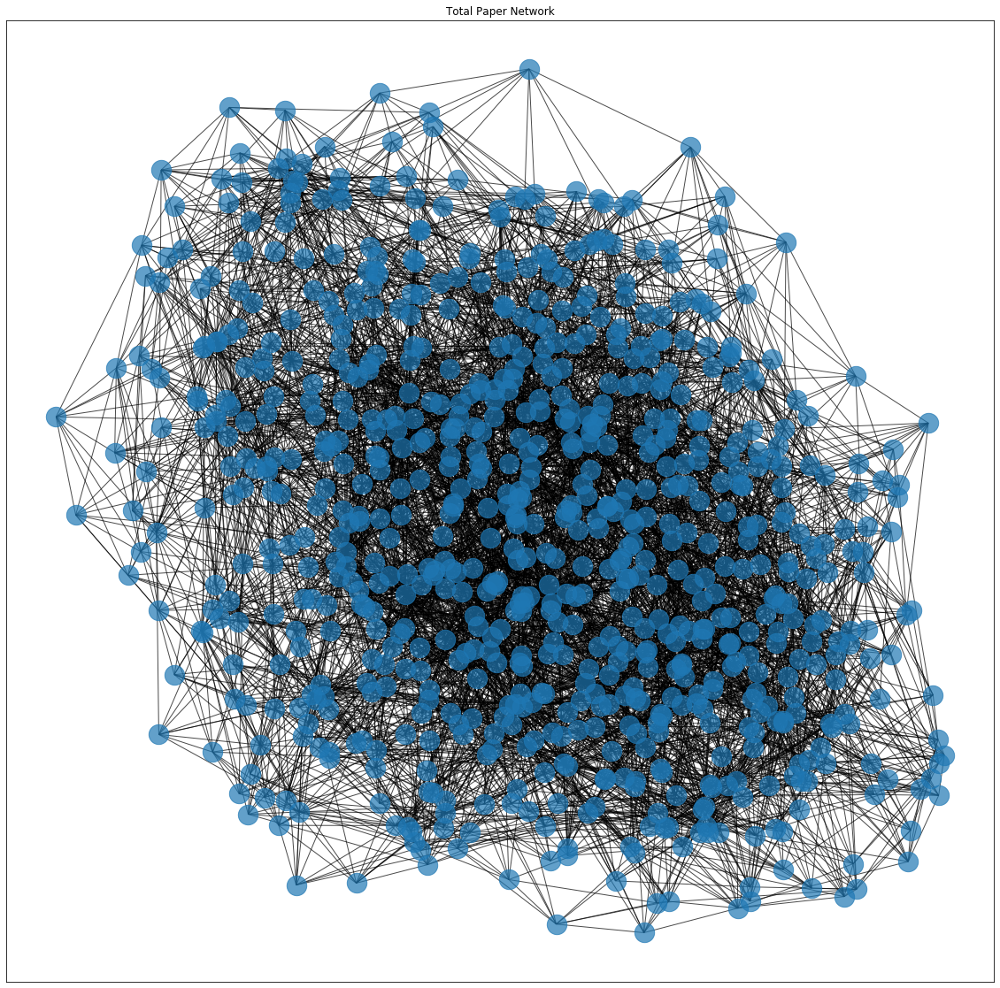

In [20]:
plt.figure(figsize = (20,20))
sp = nx.spring_layout(G)
#sp = nx.random_layout(G)
nx.draw_networkx(G,
                 pos=sp, 
                 with_labels=False,
                 node_size = 500,
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
# plt.axes('off')
plt.title('Total Paper Network')
plt.show()

In [21]:
node2vec = Node2Vec(graph=G,
                    dimensions=20,
                    walk_length=10,
                    p = 1, 
                    q = 0.0001, 
                    weight_key='weight',
                    num_walks=2000, 
                    workers=1,
                   )

for i, each_walk in enumerate(node2vec.walks):
    print(f"{i:0>2d}, {each_walk}")
    if i>1:
        break

Generating walks (CPU: 1): 100%|██████████| 2000/2000 [11:10<00:00,  2.98it/s]


00, ['DeepMDP: Learning Continuous Latent Space Models for Representation Learning', 'Learning Context-dependent Label Permutations for Multi-label Classification', 'Guarantees for Spectral Clustering with Fairness Constraints', 'Flexibly Fair Representation Learning by Disentanglement', 'A Theoretical Analysis of Contrastive Unsupervised Representation Learning', 'Feature-Critic Networks for Heterogeneous Domain Generalization', 'Beyond Backprop: Online Alternating Minimization with Auxiliary Variables', 'Unreproducible Research is Reproducible', 'Learning Optimal Fair Policies', 'Fast and Flexible Inference of Joint Distributions from their Marginals']
01, ['Graphite: Iterative Generative Modeling of Graphs', 'Relational Pooling for Graph Representations', 'NAS-Bench-101: Towards Reproducible Neural Architecture Search', 'Safe Policy Improvement with Baseline Bootstrapping', 'Decentralized Stochastic Optimization and Gossip Algorithms with Compressed Communication', 'Fair Regression:

In [22]:
model = node2vec.fit(window=10)

In [23]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
K = 5
kmeans = KMeans(n_clusters=K, random_state=0).fit(model.wv.vectors)
for n, label in zip(model.wv.index2entity, kmeans.labels_):
    G.nodes[n]['node2vec'] = label
values_nv = [n[1]['node2vec'] for n in G.nodes(data=True)]

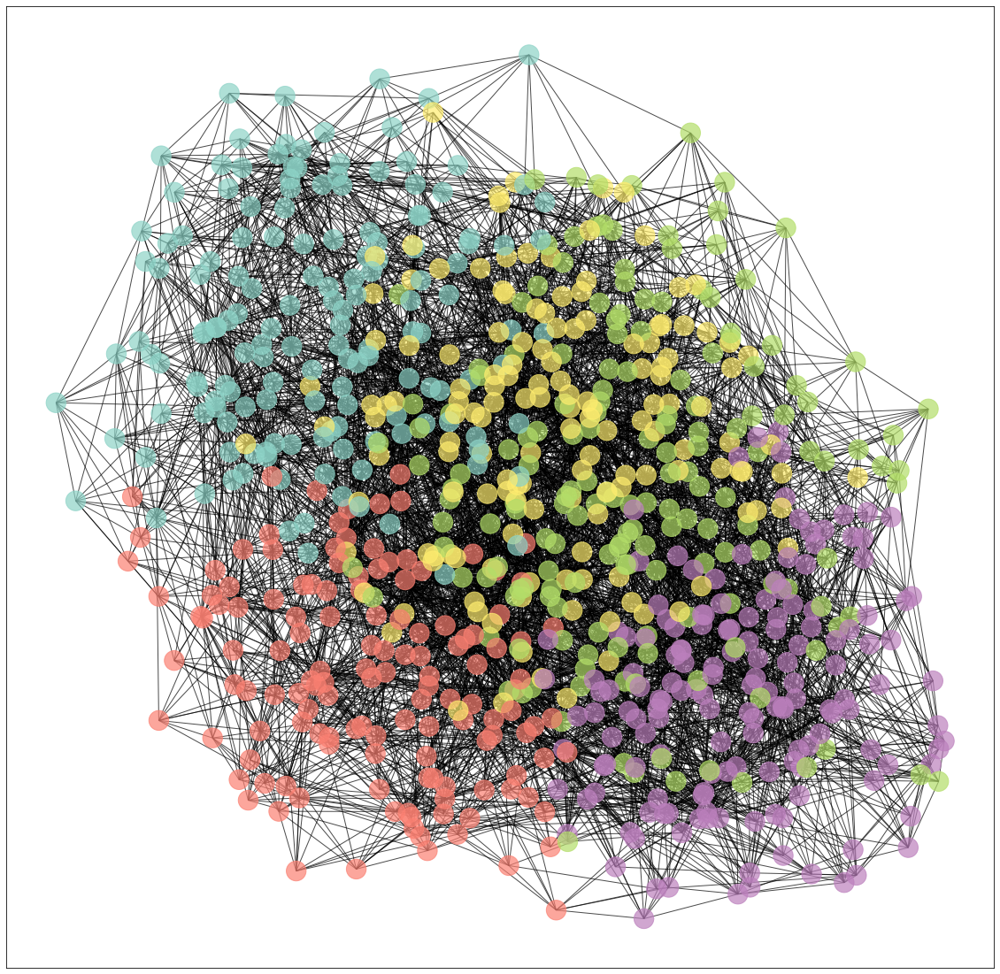

In [24]:
plt.figure(figsize = (20,20))
nx.draw_networkx(G,
                 pos=sp, 
                 with_labels=False, 
                 node_size = 500,
                 node_color=values_nv, 
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
plt.show()

In [25]:
import chart_studio.plotly as py
import plotly.graph_objs as go

In [26]:
labels = []
X = []
Y = []
for p in sp:
    labels.append(p)
    X.append(sp[p][0])
    Y.append(sp[p][1])

trace_nodes=dict(type='scatter',
                 x=X, 
                 y=Y,
                 mode='markers',
                 marker=dict(size=28, color=values_nv, 
                             colorscale = 'Viridis'),
                 text=labels,
                 hoverinfo='text')

In [27]:
Xe=[]
Ye=[]
for e in G.edges():
    Xe.extend([sp[e[0]][0], sp[e[1]][0], None])
    Ye.extend([sp[e[0]][1], sp[e[1]][1], None])

In [28]:
trace_edges=dict(type='scatter',
                 mode='lines',
                 x=Xe,
                 y=Ye,
                 line=dict(width=0.2, color='rgb(25,25,25)'),
                 hoverinfo='none' 
                )


In [31]:
axis=dict(showline=False, # hide axis line, grid, ticklabels and  title
          zeroline=False,
          showgrid=False,
          showticklabels=False,
          title='' 
          )
layout=dict(title= 'My Graph',  
            font= dict(family='Balto'),
            width=1500,
            height=1500,
            autosize=False,
            showlegend=False,
            xaxis=axis,
            yaxis=axis,
            margin=dict(
            l=40,
            r=40,
            b=85,
            t=100,
            pad=0,
       
    ),
    hovermode='closest',
    plot_bgcolor='#efecea', #set background color            
    )


fig = dict(data=[trace_edges, trace_nodes], layout=layout)

In [32]:
init_notebook_mode(connected=True)
iplot(fig)

In [45]:
from community import community_louvain
partition_lou = community_louvain.best_partition(G, weight='weight')
values_lou = [partition_lou.get(node) for node in G.nodes()]

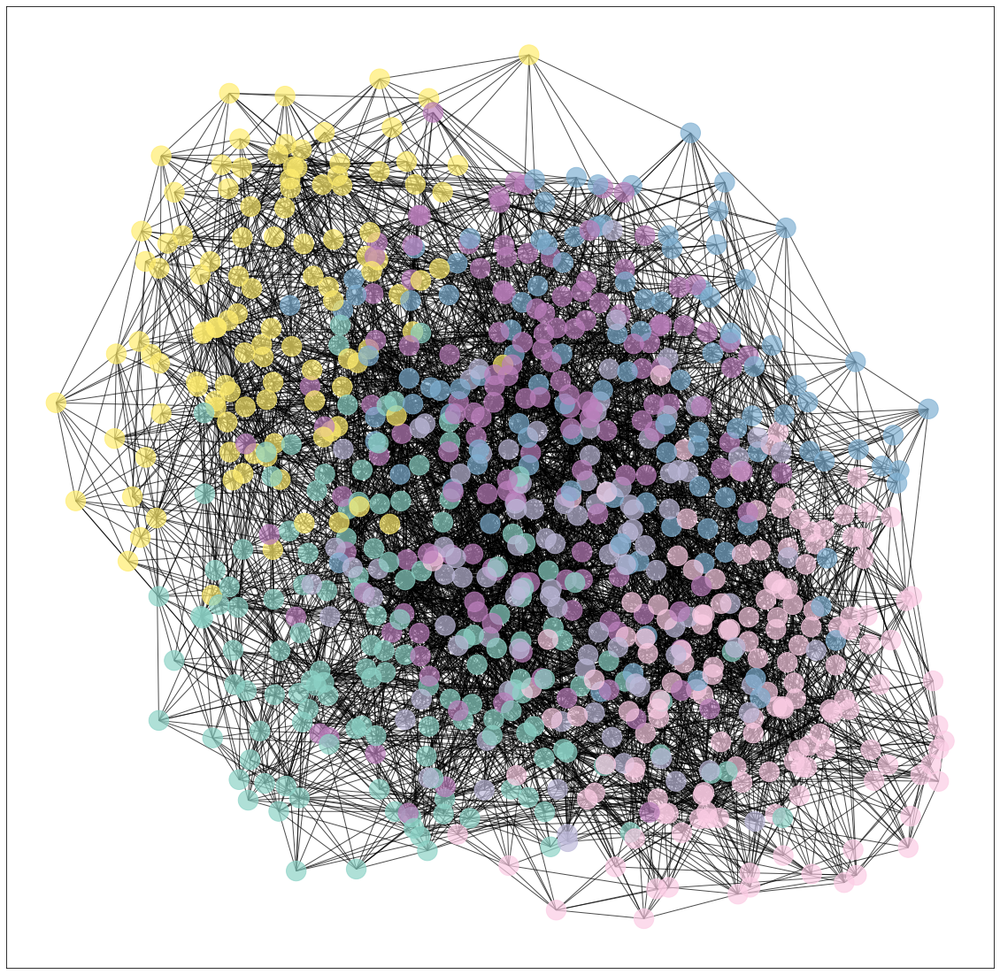

In [46]:
plt.figure(figsize = (20,20))
nx.draw_networkx(G,
                 pos=sp, 
                 with_labels=False, 
                 node_size = 500,
                 node_color=values_lou, 
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
plt.show()

In [47]:
labels = []
X = []
Y = []
for p in sp:
    labels.append(p)
    X.append(sp[p][0])
    Y.append(sp[p][1])

trace_nodes=dict(type='scatter',
                 x=X, 
                 y=Y,
                 mode='markers',
                 marker=dict(size=28, color=values_lou, 
                             colorscale = 'Viridis'),
                 text=labels,
                 hoverinfo='text')

In [48]:
Xe=[]
Ye=[]
for e in G.edges():
    Xe.extend([sp[e[0]][0], sp[e[1]][0], None])
    Ye.extend([sp[e[0]][1], sp[e[1]][1], None])

In [49]:
trace_edges=dict(type='scatter',
                 mode='lines',
                 x=Xe,
                 y=Ye,
                 line=dict(width=0.2, color='rgb(25,25,25)'),
                 hoverinfo='none' 
                )

axis=dict(showline=False, # hide axis line, grid, ticklabels and  title
          zeroline=False,
          showgrid=False,
          showticklabels=False,
          title='' 
          )

layout=dict(title= 'My Graph',  
            font= dict(family='Balto'),
            width=1500,
            height=1500,
            autosize=False,
            showlegend=False,
            xaxis=axis,
            yaxis=axis,
            margin=dict(
            l=40,
            r=40,
            b=85,
            t=100,
            pad=0,
       
    ),
    hovermode='closest',
    plot_bgcolor='#efecea', #set background color            
    )
fig = dict(data=[trace_edges, trace_nodes], layout=layout)

In [50]:
init_notebook_mode(connected=True)
iplot(fig)

In [56]:
import collections
collections.Counter(values_lou)

Counter({0: 142, 1: 100, 2: 112, 3: 153, 4: 153, 5: 113})

In [57]:
collections.Counter(values_nv)

Counter({1: 137, 2: 174, 4: 149, 3: 159, 0: 154})